<a href="https://colab.research.google.com/github/Pickase/Fifa-2020/blob/main/FIFA20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CLUSTER ANALYSIS ON FIFA20 DATASET**



Association Football is arguably the most popular sport in the world and FIFA is the most popular football simulation game by Electronic Arts (EA Sports). We will be doing Clustering Analysis which is an unsupervised learning method to categorize similar players using their traits and their different skills in the field. We will be using K-means, Hierarchical and DBSCAN clustering ML algorithms and in the end compare all models to see which one performs better.


# Tasks to be performed

Task 1 :- Explore football skills and cluster football players based on their attributes.

Task 2 :- Explore the data and attempt all the below asked questions:

  1.Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

  2.Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

  3.Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?


In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None) # For displaying all the columns

In [2]:
data=pd.read_csv('/content/drive/MyDrive/Csv/players_20.csv')
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

In [3]:
print(data.shape)
print(data.size)

(18278, 104)
1900912


### **OBSERVATION:**
There are over 18,000+ Rows and 100+ Columns in the Dataset and 19 lakhs elements in the dataset

# **Domain Analysis**

- 1.Name: Name of the player.
- 2.Age: Age of the player.
- 3.Height: Height of the player in inches (transformed to centimeters in preprocessing).
- 4.Overall: General performance quality and value of the player representing the key positional skills and international reputation rated between 1-99.
- 5.Potential: Maximum Overall rating expected to be reached by a player in the top of his career rated between 1-99.
- 6.PreferredFoot: Right or Left. Label encoder is applied as 0 for left and 1 for right.
- 7.WeakFoot: Represents how well a player uses his weak foot (e.g. left for righties) rated between 1 to 5.
- 8.WorkRate: Degree of the effort the player puts in terms of attack and defense rated as low, medium and high. This feature is divided into two new features as AttackWorkRate and DefenseWorkRate.
- 9.Position: Position of the players on the pitch which determines their roles and responsibilities in the team. Forward positions in the football and players can be grouped as striker (ST: center striker, RS: right striker, LS: left striker), forward (CF: center forward, RF: right forward, LF: left forward) and winger (RW: right winger, LW: left winger).


In [4]:
# Displaying the datatypes of the columns

data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18278 non-null  int64  
 1    player_url                  18278 non-null  object 
 2    short_name                  18278 non-null  object 
 3    long_name                   18278 non-null  object 
 4    age                         18278 non-null  int64  
 5    dob                         18278 non-null  object 
 6    height_cm                   18278 non-null  int64  
 7    weight_kg                   18278 non-null  int64  
 8    nationality                 18278 non-null  object 
 9    club                        18278 non-null  object 
 10   overall                     18278 non-null  int64  
 11   potential                   18278 non-null  int64  
 12   value_eur                   18278 non-null  int64  
 13   wage_eur      

OBSERVATION:

From the above line we got the data types of our features.

    data types: float64(16), int64(45), object(43)

We must note that we need to deal with object data types as numeric data is preferred for training models well.

The following columns: release_clause_eur, player_tags, team_position, team_jersey_number, loaned_from, joined, contract_valid_until, nation_position, nation_jersey_number, pace, shooting, passing, dribbling, defending, physic, gk_diving, gk_handling, gk_kicking, gk_reflexes, gk_speed, gk_positioning, player_traits, ls, st, rs, lw, lf, cf, rf, rw, lam, cam, ram, lm, lcm, cm, rcm, rm, lwb, ldm, cdm, rdm, rwb, lb, lcb, cb, rcb, rb has missing values

In [5]:
#Basic Statistic of the Dataset

data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

## Data Preprocessing

In [6]:
# checking the percentage of missing values

percentage_missing_values = data.isnull().sum().sort_values(ascending = False) / len(data) * 100

print(percentage_missing_values.to_string())

loaned_from                   94.266331
nation_position               93.839589
nation_jersey_number          93.839589
player_tags                   91.798884
gk_speed                      88.860926
gk_diving                     88.860926
gk_handling                   88.860926
gk_reflexes                   88.860926
gk_kicking                    88.860926
gk_positioning                88.860926
player_traits                 58.605974
lf                            11.139074
lw                            11.139074
rs                            11.139074
physic                        11.139074
defending                     11.139074
dribbling                     11.139074
passing                       11.139074
shooting                      11.139074
st                            11.139074
ls                            11.139074
rb                            11.139074
pace                          11.139074
rdm                           11.139074
rwb                           11.139074


#### OBSERVATION:
- There are some redundant columns which can also be dropped, some of the columns have missing values greater than 50%, since these data are player specific, hence these columns can be dropped.
- The aim of the project is not basically sort and categorize the players using their overall talent and international reputation, but to cluster them based on using their whole skillset, hence these columns can be dropped too.


In [7]:
# Removing Redundant and Missing value (greater than 50% ) columns and columns that are not useful for model building

drop_features = ['overall','international_reputation','sofifa_id','player_url','short_name','nationality', 'club','player_tags','long_name','dob','player_positions',
                     'team_jersey_number','nation_jersey_number','nation_position','loaned_from',
                     'release_clause_eur','player_traits','body_type','real_face','joined', 'contract_valid_until',
                     'gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning']

# droping the features
data_model = data.drop(drop_features, axis = 1)

In [8]:
data_model.describe()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,25.283291,181.362184,75.276343,71.546887,2.484038e+06,9456.942773,2.944250,2.368038,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,4.656964,6.756961,7.047744,6.139669,5.585481e+06,21351.714095,0.664656,0.765038,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,16.000000,156.000000,50.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,22.000000,177.000000,70.000000,67.000000,3.250000e+05,1000.000000,3.000000,2.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.000000,55.000000,56.000000,56.000000,48.000000,58.000000,56.000000,58.000000,32.000000,44.000000,25.000000,39.000000,44.000000,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,25.000000,181.000000,75.000000,71.000000,7.000000e+05,3000.000000,3.000000,2.000000,69.000000,54.000000,58.000000,64.000000,56.000000,66.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,49.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,66.000000,51.000000,58.000000,52.000000,55.000000,55.000000,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,29.000000,186.000000,80.000000,75.000000,2.100000e+06,8000.000000,3.000000,3.000000,75.000000,63.000000,64.000000,69.000000,65.000000,72.000000,64.000000,62.000000,64.000000,

**Looking at the minimum and maximum values of each numerical features, it is concluded that there are no outliers in this data. The exceptional values in the data will be handled while performing Robust scaling which uses the interquartile range.** 

In [9]:
data_model.shape

(18278, 77)

### Imputing Missing Values 

In [10]:
data_model['team_position'].mode()

0    SUB
Name: team_position, dtype: object

In [11]:
# Imputing team position column with MODE

data_model['team_position']=data_model['team_position'].fillna(data_model['team_position'].mode()[0])

In [12]:
# Imputing skill column with MEAN of the respective columns

data_model.loc[data_model['pace'].isnull(),'pace'] =data_model['pace'].mean()
data_model.loc[data_model['physic'].isnull(),'physic'] =data_model['physic'].mean()
data_model.loc[data_model['shooting'].isnull(),'shooting'] =data_model['shooting'].mean()
data_model.loc[data_model['passing'].isnull(),'passing'] =data_model['passing'].mean()
data_model.loc[data_model['dribbling'].isnull(),'dribbling'] =data_model['dribbling'].mean()
data_model.loc[data_model['defending'].isnull(),'defending'] =data_model['defending'].mean()

In [13]:
# Creating a seperate dataframe for positional skills of the players

columns = ['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb',
           'ldm', 'cdm','rdm','rwb','lb','lcb','cb','rcb','rb']

In [14]:
for col in columns:
  data_model[col]=data_model[col].str.split('+',n=1,expand = True)[0]

data_model[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32,32,32,31,31,31,31,31,31,31,31,33,33,33,33,33,43,42,42,42,43,45,46,46,46,45
18274,33,33,33,33,32,32,32,33,33,33,33,35,36,36,36,35,44,43,43,43,44,46,47,47,47,46
18275,43,43,43,43,43,43,43,43,44,44,44,45,46,46,46,45,47,49,49,49,47,47,49,49,49,47
18276,43,43,43,45,44,44,44,45,46,46,46,46,46,46,46,46,48,48,48,48,48,48,49,49,49,48


In [15]:
# Imputing positional skills of the players with Zero

data_model[columns] = data_model[columns].fillna(0)
data_model[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32,32,32,31,31,31,31,31,31,31,31,33,33,33,33,33,43,42,42,42,43,45,46,46,46,45
18274,33,33,33,33,32,32,32,33,33,33,33,35,36,36,36,35,44,43,43,43,44,46,47,47,47,46
18275,43,43,43,43,43,43,43,43,44,44,44,45,46,46,46,45,47,49,49,49,47,47,49,49,49,47
18276,43,43,43,45,44,44,44,45,46,46,46,46,46,46,46,46,48,48,48,48,48,48,49,49,49,48


In [16]:
data_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 77 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         18278 non-null  int64  
 1   height_cm                   18278 non-null  int64  
 2   weight_kg                   18278 non-null  int64  
 3   potential                   18278 non-null  int64  
 4   value_eur                   18278 non-null  int64  
 5   wage_eur                    18278 non-null  int64  
 6   preferred_foot              18278 non-null  object 
 7   weak_foot                   18278 non-null  int64  
 8   skill_moves                 18278 non-null  int64  
 9   work_rate                   18278 non-null  object 
 10  team_position               18278 non-null  object 
 11  pace                        18278 non-null  float64
 12  shooting                    18278 non-null  float64
 13  passing                     182

In [17]:
# Converting positional skill columns into integer type

data_model[columns] =data_model[columns].astype(int)

In [18]:
# checking the percentage of missing values

percentage_missing_values = data_model.isnull().sum().sort_values(ascending = False) / len(data) * 100

print(percentage_missing_values.to_string())

age                           0.0
goalkeeping_positioning       0.0
cf                            0.0
lf                            0.0
lw                            0.0
rs                            0.0
st                            0.0
ls                            0.0
goalkeeping_reflexes          0.0
goalkeeping_kicking           0.0
mentality_positioning         0.0
goalkeeping_handling          0.0
goalkeeping_diving            0.0
defending_sliding_tackle      0.0
defending_standing_tackle     0.0
defending_marking             0.0
mentality_composure           0.0
mentality_penalties           0.0
rf                            0.0
rw                            0.0
lam                           0.0
cam                           0.0
rcb                           0.0
cb                            0.0
lcb                           0.0
lb                            0.0
rwb                           0.0
rdm                           0.0
cdm                           0.0
ldm           

In [19]:
data_model.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,work_rate,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,94,95500000,565000,Left,4,4,Medium/Low,RW,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,34,187,83,93,58500000,405000,Right,4,5,High/Low,LW,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,27,175,68,92,105500000,290000,Right,5,5,High/Medium,CAM,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,26,188,87,93,77500000,125000,Right,3,1,Medium/Medium,GK,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,28,175,74,91,90000000,470000,Right,4,4,High/Medium,LW,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61


#### OBSERVATION

All the missing values has been treated

### Label Encoding

In [20]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
data_model['preferred_foot'] = lb.fit_transform(data_model['preferred_foot'])
data_model['team_position'] = lb.fit_transform(data_model['team_position'])

In [21]:
data_model.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,work_rate,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,94,95500000,565000,0,4,4,Medium/Low,25,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,34,187,83,93,58500000,405000,1,4,5,High/Low,14,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,27,175,68,92,105500000,290000,1,5,5,High/Medium,0,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,26,188,87,93,77500000,125000,1,3,1,Medium/Medium,5,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,28,175,74,91,90000000,470000,1,4,4,High/Medium,14,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61


In [22]:
# Seperating Attack and Defence Work Rate

data_model[['attack_work_rate', 'defence_work_rate']] = data.work_rate.str.split("/",expand = True)

In [23]:
# Value count for attack work rate

data_model.attack_work_rate.value_counts()

Medium    12479
High       4886
Low         913
Name: attack_work_rate, dtype: int64

In [24]:
# Value count for defence work rate 

data_model.defence_work_rate.value_counts()

Medium    13552
High       3121
Low        1605
Name: defence_work_rate, dtype: int64

In [25]:
# Converting into attack work rate numeric data

data_model['attack_work_rate'] = data_model['attack_work_rate'].map({'Low':0, 'Medium':0.5,'High':1})

In [26]:
# Converting into defence work rate numeric data

data_model['defence_work_rate'] = data_model['defence_work_rate'].map({'Low':0, 'Medium':0.5,'High':1})

In [27]:
# Droping work rate column

data_model.drop('work_rate',axis=1, inplace=True)

In [28]:
# Finding the correlation between two features

cor_matrix = data_model.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))


# List of all columns that shows correlation greater than 0.95

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(to_drop) 

['defending_sliding_tackle', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']


Some of the features can be eliminated as these features will not impact the results of model building.

In [29]:
data_model.drop(['defending_sliding_tackle', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'], axis=1, inplace=True)

<Axes: >

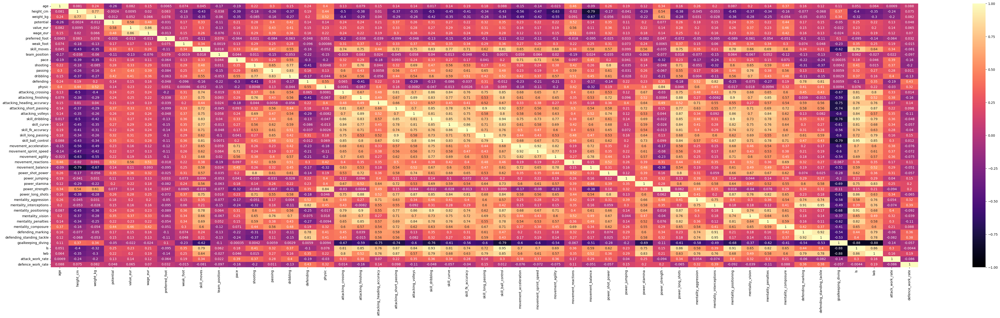

In [30]:
# Checking correlation between features using heatmap 

plt.figure(figsize=(60,15), dpi=100)

sns.heatmap(data_model.corr(),annot=True, cmap = "magma" , vmin = -1 , vmax = 1, center=0)

In [31]:
# Final shape of the dataset for model building

data_model.shape

(18278, 49)

In [32]:
data_model.head(5)

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,goalkeeping_diving,ls,lwb,attack_work_rate,defence_work_rate
0,32,170,72,94,95500000,565000,0,4,4,25,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,6,89,68,0.5,0.0
1,34,187,83,93,58500000,405000,1,4,5,14,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,7,91,65,1.0,0.0
2,27,175,68,92,105500000,290000,1,5,5,0,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,9,84,66,1.0,0.5
3,26,188,87,93,77500000,125000,1,3,1,5,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,87,0,0,0.5,0.5
4,28,175,74,91,90000000,470000,1,4,4,14,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,11,83,66,1.0,0.5


The below code will identify those features that are the same in at least 90% of the instances.

In [33]:
data_model

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,goalkeeping_diving,ls,lwb,attack_work_rate,defence_work_rate
0,32,170,72,94,95500000,565000,0,4,4,25,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,6,89,68,0.5,0.0
1,34,187,83,93,58500000,405000,1,4,5,14,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,7,91,65,1.0,0.0
2,27,175,68,92,105500000,290000,1,5,5,0,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,9,84,66,1.0,0.5
3,26,188,87,93,77500000,125000,1,3,1,5,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,87,0,0,0.5,0.5
4,28,175,74,91,90000000,470000,1,4,4,14,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,11,83,66,1.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,22,186,79,56,40000,2000,1,3,2,21,57.000000,23.000000,28.000000,33.000000,47.000000,51.000000,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,5,32,43,0.5,1.0
18274,22,177,66,56,40000,2000,1,2,2,28,58.000000,24.000000,33.000000,35.000000,48.000000,48.000000,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,13,33,44,0.5,0.5
18275,19,186,75,56,40000,1000,1,2,2,28,54.000000,35.000000,44.000000,45.000000,48.000000,51.000000,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,7,43,47,0.0,0.5
18276,18,185,74,54,40000,1000,1,2,2,28,59.000000,35.000000,47.000000,47.000000,45.000000,52.000000,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,14,43,48,0.0,0.0


### Scaling of the Data

In [34]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize

In [35]:
# Using Robust Scaler

r_scaler = preprocessing.RobustScaler()

In [36]:
data_r_scaler=r_scaler.fit_transform(data_model)

In [37]:
data_Final=pd.DataFrame(data_r_scaler) 

In [38]:
data_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 49 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       18278 non-null  float64
 1   1       18278 non-null  float64
 2   2       18278 non-null  float64
 3   3       18278 non-null  float64
 4   4       18278 non-null  float64
 5   5       18278 non-null  float64
 6   6       18278 non-null  float64
 7   7       18278 non-null  float64
 8   8       18278 non-null  float64
 9   9       18278 non-null  float64
 10  10      18278 non-null  float64
 11  11      18278 non-null  float64
 12  12      18278 non-null  float64
 13  13      18278 non-null  float64
 14  14      18278 non-null  float64
 15  15      18278 non-null  float64
 16  16      18278 non-null  float64
 17  17      18278 non-null  float64
 18  18      18278 non-null  float64
 19  19      18278 non-null  float64
 20  20      18278 non-null  float64
 21  21      18278 non-null  float64
 22

In [39]:
data_Final.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48
0,1.000000,-1.222222,-0.3,2.875,53.408451,80.285714,-1.0,1.0,2.0,0.181818,1.754464,2.205650,3.160566,3.042583,-0.52000,0.102120,1.307692,1.43750,0.70,2.142857,1.692308,2.000000,1.571429,2.12,1.714286,2.200000,1.263158,0.944444,1.421053,2.750000,1.611111,1.35,0.133333,0.500000,0.1250,1.433333,-0.40,-0.307692,1.56,1.95,1.238095,2.2500,-0.542857,-0.461538,-0.833333,2.0000,0.800000,0.0,-0.5
1,1.285714,0.666667,0.8,2.750,32.563380,57.428571,0.0,1.0,3.0,-0.818182,2.027191,2.261206,2.251475,2.406220,-0.68000,1.193029,1.153846,1.40625,1.65,1.500000,1.653846,1.555556,1.142857,1.40,1.000000,1.933333,1.157895,1.333333,1.105263,2.833333,0.277778,1.80,1.933333,1.055556,0.7500,1.400000,0.20,-0.589744,1.60,1.35,1.714286,2.1875,-0.685714,-0.589744,-0.666667,2.1250,0.600000,1.0,-0.5
2,0.285714,-0.666667,-0.7,2.625,59.042254,41.000000,0.0,2.0,3.0,-2.090909,2.118100,1.816761,2.706020,2.951674,-0.80000,-0.625153,1.269231,1.18750,0.30,1.785714,1.653846,1.944444,1.392857,1.84,1.190476,2.133333,1.421053,1.222222,1.578947,2.500000,1.000000,1.05,-0.333333,0.833333,-1.0625,1.100000,-0.28,-0.410256,1.28,1.75,1.952381,2.1250,-0.714286,-0.743590,-0.333333,1.6875,0.666667,1.0,0.0
3,0.142857,0.777778,1.2,2.750,43.267606,17.428571,0.0,0.0,-1.0,-1.636364,0.000000,0.000000,0.000000,0.000000,-0.01786,0.000000,-1.576923,-1.18750,-2.05,-1.357143,-1.192308,-2.722222,-1.285714,-1.08,-0.761905,-2.200000,-1.263158,-0.388889,0.052632,2.166667,-0.944444,0.00,0.800000,-1.388889,0.7500,-1.300000,-0.96,-0.846154,-1.76,0.50,-1.809524,0.5000,-0.714286,-1.102564,12.666667,-3.5625,-3.733333,0.0,0.0
4,0.428571,-0.666667,-0.1,2.500,50.309859,66.714286,0.0,1.0,2.0,-0.818182,2.118100,1.705650,2.615111,2.860765,-0.68000,0.102120,1.038462,1.09375,0.25,1.928571,1.500000,1.888889,1.214286,1.52,1.285714,2.066667,1.421053,1.166667,1.526316,2.333333,1.555556,1.15,-0.666667,1.000000,-0.1875,0.966667,-0.16,-0.282051,1.28,1.70,1.857143,1.9375,-0.514286,-0.717949,0.000000,1.6250,0.666667,1.0,0.0


In [40]:
data_Final.shape

(18278, 49)

### Dimentionality Reduction using Principal Component Analysis

In [41]:
from sklearn.decomposition import PCA
pca=PCA()

In [42]:
data_pca =pca.fit_transform(data_Final)

In [43]:
# The explained variance ratio is the percentage of variance that is attributed by each of the selected components.

explained_variance=pca.explained_variance_ratio_

print(explained_variance)

[4.22815048e-01 2.78974471e-01 7.83518346e-02 4.60066140e-02
 2.83649417e-02 2.48508065e-02 2.12225186e-02 1.12257705e-02
 9.00810388e-03 8.71792488e-03 6.59774472e-03 5.68788776e-03
 4.86639155e-03 4.26453530e-03 3.94017924e-03 3.41389070e-03
 3.22344073e-03 3.11503208e-03 2.90240229e-03 2.71269133e-03
 2.50328098e-03 2.37079130e-03 2.14916074e-03 2.06645274e-03
 1.95067904e-03 1.91463479e-03 1.70231026e-03 1.59507620e-03
 1.56703098e-03 1.35097865e-03 1.27073274e-03 1.17939100e-03
 1.02076494e-03 9.14928162e-04 8.48799876e-04 8.22506688e-04
 7.71961267e-04 7.41132447e-04 6.88374715e-04 5.39262501e-04
 5.19158001e-04 4.35571294e-04 2.69615658e-04 2.52062448e-04
 1.62660855e-04 7.72062493e-05 2.65907354e-05 1.90428935e-05
 7.61239248e-06]


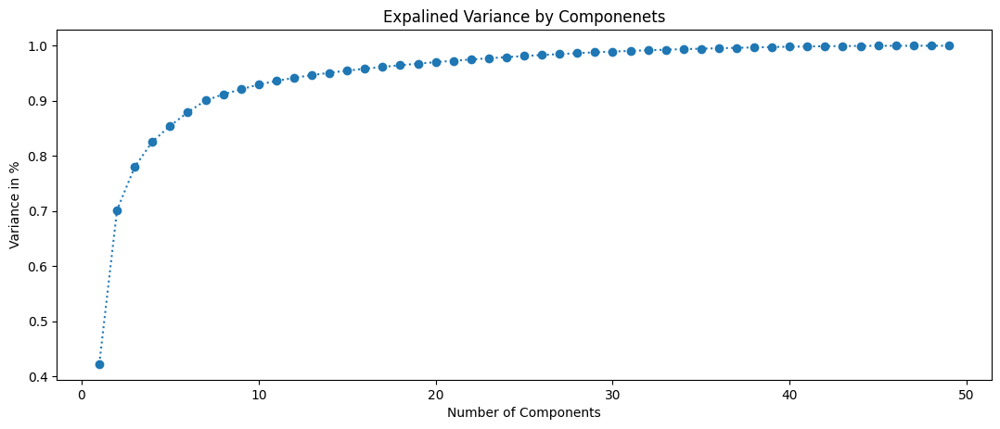

In [44]:
# Scree plot to get the optimum value of principal components

plt.figure(figsize=(13,5),dpi=100)

plt.plot(range(1,50), pca.explained_variance_ratio_.cumsum(), marker='o',linestyle='dotted')

plt.xlabel('Number of Components')
plt.ylabel('Variance in %') # for each component
plt.title('Expalined Variance by Componenets')
plt.show()

3 Components are enough to get close to 80% variance. Let's choose 3 as a Number of Principal Components

In [45]:
pca = PCA(n_components=3, random_state=42)
data_pca = pca.fit_transform(data_Final)

In [46]:
data_pca_df=pd.DataFrame(data_pca)

In [47]:
data_pca_df.columns = ['PC1', 'PC2', 'PC3']

In [48]:
data_pca_df.head()

,PC1,PC2,PC3
0,65.821373,62.963483,8.214552
1,45.823555,41.293929,5.548369
2,50.771196,46.588193,2.221256
3,18.351616,39.642235,1.801655
4,57.525352,55.255714,6.116808


## Model Building

We will be comparing K-means, Hierarchical and DBSCAN clustering methods in order to predict the categorization of similar players using their traits and their different skills in the field. The results of these different clustering methods will be evaluated using silhouette score.

### Clustering Method 1:  KMeans

In [49]:
from sklearn.cluster import KMeans

In [50]:
WCSS =[] # withing cluster sum of square

for k in range (2,11):
    km = KMeans(n_clusters=k,random_state=5)
    km.fit(data_pca)
    WCSS.append(km.inertia_)

In [51]:
WCSS

[474732.35292312474,
 282244.57578117965,
 194958.26869263404,
 138662.8294610981,
 112590.27937454547,
 96707.36751770525,
 86096.84168997224,
 78483.53147487013,
 70916.40692286253]

Text(0, 0.5, 'WCSS')

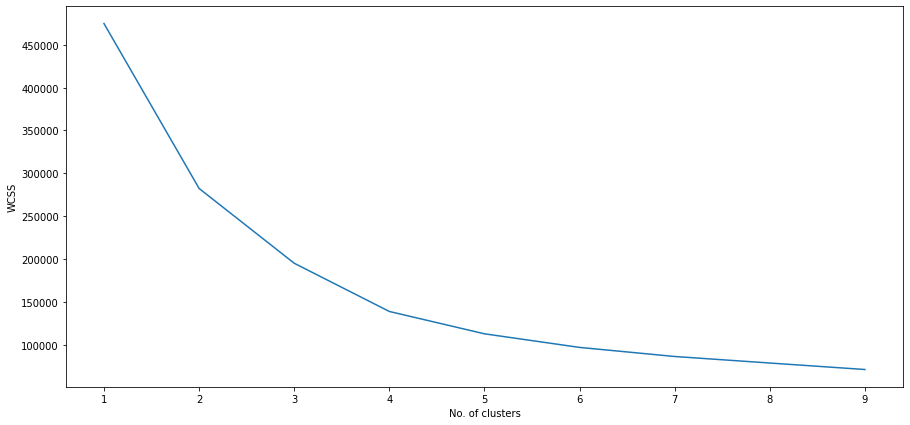

In [52]:
plt.figure(figsize=(15,7))

plt.plot(list(range(1,10)),WCSS)
plt.xlabel('No. of clusters')
plt.ylabel('WCSS')

In [53]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn import datasets
from sklearn.metrics import silhouette_score

In [54]:
# Silhouette Score for different numbers of clusters
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
silhouette_scr = []
for num_clusters in range_n_clusters:
  kmeans = KMeans(n_clusters=num_clusters)
  kmeans.fit_transform(data_pca_df)
  cluster_labels = kmeans.labels_
  silhouette_scr.append(silhouette_score(data_pca_df, cluster_labels))

In [55]:
silhouette_scr

[0.667833123944677,
 0.6920357313489557,
 0.549366318293366,
 0.45130957734813587,
 0.4573504476013168,
 0.3865649331379856,
 0.38409968108154907,
 0.3938937679778521,
 0.3841824415170875]

Text(0, 0.5, 'Silhouette score')

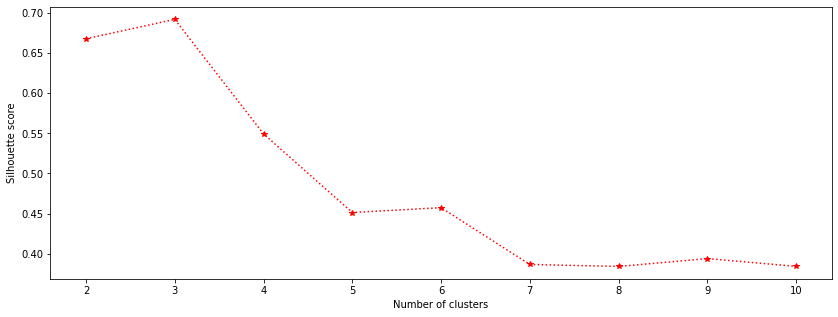

In [56]:
plt.figure(figsize=(14,5))
plt.plot(range_n_clusters,silhouette_scr,color='red',marker='*',linestyle='dotted')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')

#### For KMeans modeling, choosing K=2 as our number of clusters.

In [57]:
k_model = KMeans(n_clusters = 2, random_state = 1)

In [58]:
k_model.fit(data_pca)

KMeans(n_clusters=2, random_state=1)

In [59]:
label = k_model.labels_

In [60]:
label

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [61]:
silhouette_score(data_pca, label)

0.667833123944677

In [62]:
data_pca_df.head()

,PC1,PC2,PC3
0,65.821373,62.963483,8.214552
1,45.823555,41.293929,5.548369
2,50.771196,46.588193,2.221256
3,18.351616,39.642235,1.801655
4,57.525352,55.255714,6.116808


In [63]:
#Implementing the Model
kmeans_pca = KMeans(n_clusters = 2, random_state=42).fit(data_pca_df)
kmeans_pca_clustered = pd.DataFrame(data_pca_df.copy())
kmeans_pca_clustered.loc[:,'Cluster'] = kmeans_pca.labels_

In [64]:
kmeans_pca_clustered.shape

(18278, 4)

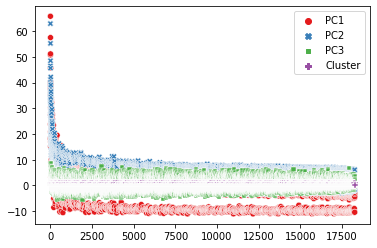

In [65]:
sns.scatterplot( data=kmeans_pca_clustered,palette='Set1', legend='full')
plt.show()

In [66]:
KM_clust_sizes = kmeans_pca_clustered.groupby('Cluster').size().to_frame()
KM_clust_sizes.columns = ["KM_size"]
KM_clust_sizes

,KM_size
Cluster,
0,16242
1,2036


In [67]:
kmeans_pca_clustered.head()

,PC1,PC2,PC3,Cluster
0,65.821373,62.963483,8.214552,0
1,45.823555,41.293929,5.548369,0
2,50.771196,46.588193,2.221256,0
3,18.351616,39.642235,1.801655,1
4,57.525352,55.255714,6.116808,0


In [68]:
data_Clustered = pd.concat([data, kmeans_pca_clustered[['Cluster']]],axis=1)
data_Clustered.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,0
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0

In [69]:
data_1_Cluster = data_Clustered[data_Clustered["Cluster"] == 1]
data_1_Cluster.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
6,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,90,93,67500000,250000,GK,Right,3,4,1,Medium/Medium,Normal,Yes,143400000.0,NaN,GK,1.0,NaN,2014-07-01,2022.0,SUB,22.0,NaN,NaN,NaN,NaN,NaN,NaN,88.0,85.0,88.0,90.0,45.0,88.0,"Swerve Pass, Acrobatic Clearance, Flair Passes",18,14,11,61,14,21,18,12,63,30,38,50,37,86,43,66,79,35,78,10,43,22,11,70,25,70,25,13,10,88,85,88,88,90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
13,212831,https://sofifa.com/player/212831/alisson-ramse...,Alisson,Alisson Ramses Becker,26,1992-10-02,191,91,Brazil,Liverpool,89,91,58000000,155000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,111700000.0,NaN,GK,1.0,NaN,2018-07-19,2024.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.0,84.0,85.0,89.0,51.0,90.0,"Flair, Swerve Pass",17,13,19,45,20,27,19,18,44,30,56,47,40,88,37,64,52,32,78,14,27,11,13,66,23,65,15,19,16,85,84,85,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
14,193080,https://sofifa.com/player/193080/david-de-gea-...,De Gea,David De Gea Quintana,28,1990-11-07,192,82,Spain,Manchester United,89,90,56000000,205000,GK,Right,4,3,1,Medium/Medium,Lean,Yes,110600000.0,NaN,GK,1.0,NaN,2011-07-01,2020.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,90.0,84.0,81.0,92.0,58.0,85.0,"Flair, Second Wind, Flair Passes",17,13,21,50,13,18,21,19,47,38,57,58,63,87,43,61,67,43,60,12,38,30,12,65,29,68,25,21,13,90,84,81,85,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
25,210257,https://sofifa.com/player/210257/ederson-santa...,Ederson,Ederson Santana de Moraes,25,1993-08-17,188,86,Brazil,Manchester City,88,91,54500000,185000,GK,Left,2,3,1,Medium/Medium,Normal,Yes,104900000.0,NaN,GK,31.0,NaN,2017-07-01,2024.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.0,82.0,93.0,88.0,63.0,86.0,"Leadership, Swerve Pass, Acrobatic Clearance",20,14,14,56,18,23,15,20,58,40,64,63,60,87,48,70,66,41,68,18,38,27,20,70,17,70,29,15,8,86,82,93,86,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [70]:
data_0_Cluster = data_Clustered[data_Clustered["Cluster"] == 0]
data_0_Cluster.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,0
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,2024.0,LF,10.0,91.0,83.0,86.0,94.0,35.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, C

In [71]:
data_0_Cluster.wage_eur.mean()

9806.550917374707

In [72]:
data_1_Cluster.wage_eur.mean()

6667.976424361493

In [73]:
data_0_Cluster.age.mean()

25.16001723925625

In [74]:
data_1_Cluster.age.mean()

26.266699410609036

In [75]:
data_0_Cluster.value_eur.mean()

2578808.02856791

In [76]:
data_1_Cluster.value_eur.mean()

1728015.717092338

In [77]:
data_1_Cluster.team_position.value_counts()

SUB    928
GK     662
RES    406
Name: team_position, dtype: int64

In [78]:
data_0_Cluster.team_position.value_counts()

SUB    6892
RES    2552
RCB     660
LCB     660
RB      560
LB      560
ST      458
LCM     411
RCM     411
RM      399
LM      398
CAM     311
RDM     244
LDM     242
RS      195
LS      195
CDM     181
LW      162
RW      161
CB      100
CM       76
RWB      58
LWB      58
RAM      23
LAM      23
RF       19
LF       19
CF       14
Name: team_position, dtype: int64

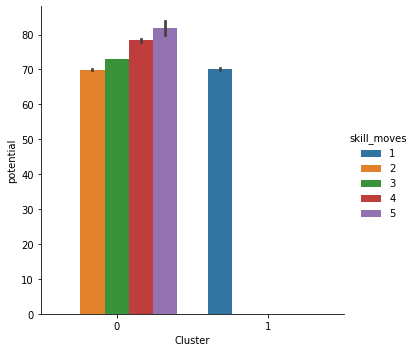

In [79]:
sns.catplot(data=data_Clustered, x="Cluster", y="potential", kind="bar", hue='skill_moves')

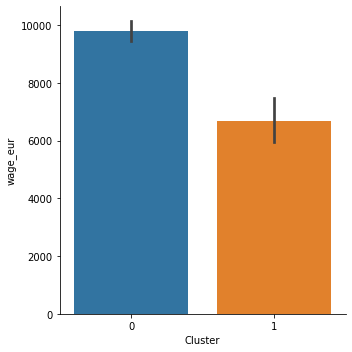

In [80]:
sns.catplot(data=data_Clustered, x="Cluster", y="wage_eur", kind="bar")

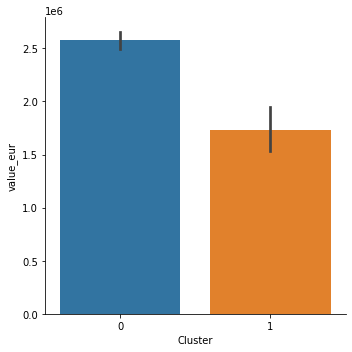

In [81]:
sns.catplot(data=data_Clustered, x="Cluster", y="value_eur", kind="bar")

### Clustering Method 2: Agglomerative Hierarchical Clustering

Silhouette score is a metric used to calculate the goodness of a clustering technique. Its value ranges from -1 to 1. 1: Means clusters are well apart from each other and clearly distinguished

In [82]:
data_pca_df.head()

,PC1,PC2,PC3
0,65.821373,62.963483,8.214552
1,45.823555,41.293929,5.548369
2,50.771196,46.588193,2.221256
3,18.351616,39.642235,1.801655
4,57.525352,55.255714,6.116808


**Finding Number of clusters using Dendrogram**

The x-axis contains the samples and y-axis represents the distance between these samples. Using Dendrogram, we will now determine the optimal number of clusters for our model. For this, we will find the maximum vertical distance that does not cut any horizontal bar.

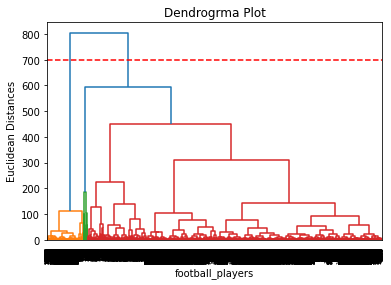

In [83]:
#Finding the optimal number of clusters using the dendrogram  
import scipy.cluster.hierarchy as shc  
dendro = shc.dendrogram(shc.linkage(data_pca_df, method="ward"))  
plt.axhline(y=700, color='r', linestyle='--')
plt.title("Dendrogrma Plot")  
plt.ylabel("Euclidean Distances")  
plt.xlabel("football_players")  
plt.show()

We have two clusters as this line cuts the dendrogram at two points. Let’s now apply hierarchical clustering for 2 clusters:

In [84]:
# Implementing the Model

from sklearn.cluster import AgglomerativeClustering

data_agg_clustered= AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
data_agg_clustered.fit_predict(data_pca_df)
data_agg_clustered_df=pd.DataFrame(data_pca_df.copy())
data_agg_clustered_df.loc[:,'Cluster'] = data_agg_clustered.labels_

In [85]:
silhouette_score(data_pca_df, data_agg_clustered.labels_)

0.6635289576988502

In [86]:
Hier_clust_sizes = data_agg_clustered_df.groupby('Cluster').size().to_frame()
Hier_clust_sizes.columns = ["Hier_size"]
Hier_clust_sizes

,Hier_size
Cluster,
0,16262
1,2016


In [87]:
data_agg_clustered_df.head()

,PC1,PC2,PC3,Cluster
0,65.821373,62.963483,8.214552,0
1,45.823555,41.293929,5.548369,0
2,50.771196,46.588193,2.221256,0
3,18.351616,39.642235,1.801655,0
4,57.525352,55.255714,6.116808,0


Scatter plots for Visualising our Clusters

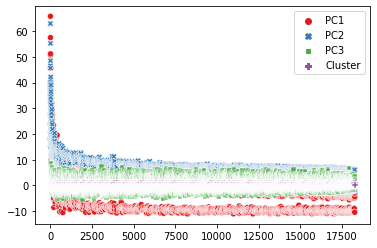

In [89]:
sns.scatterplot(data=data_agg_clustered_df,palette='Set1', legend='full')
plt.show()

Cluster No. 0 has more number of players compared to Cluster No. 1

In [91]:
# 3D Plot for visualising Clusters

Scene = dict(xaxis = dict(title  = 'P1'),yaxis = dict(title  = 'P2'),zaxis = dict(title  = 'P3'))
labels = data_agg_clustered.labels_
trace = go.Scatter3d(x=data_agg_clustered_df.iloc[:,0], y=data_agg_clustered_df.iloc[:,1], z=data_agg_clustered_df.iloc[:,2], 
                     mode='markers', marker=dict(color = labels, colorscale='rainbow', 
                                                size = 3, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height =750,width = 1000)
dt2 = [trace]
fig = go.Figure(dt2, layout = layout)
fig.update_layout(title='Agg Hierarchial Clustering', font=dict(size=12,))
fig.show()

### Clustering Method 3: DBSCAN 

In [92]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

- Before we apply the clustering algorithm we have to determine the appropriate epsilon level using the “Elbow Method”.

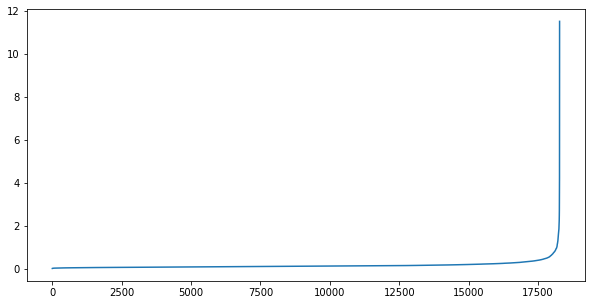

In [93]:
plt.figure(figsize=(10,5))
nn = NearestNeighbors(n_neighbors=5).fit(data_pca_df)
distances, idx = nn.kneighbors(data_pca_df)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()

- It would seem the optimal epsilon value is around 1.0 to 1.8 . Since we have 3 principal components to our data, minimum points criteria should be 6 aned above.

- Let's iterate through different esp values and min_sample values to find out optimal number of clusters by looking at different values of silhouette scores.

In [94]:
from itertools import product
pca_eps_values = np.arange(1.0,1.9,0.1) 
pca_min_samples = np.arange(6,10) 
pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps = p[0], min_samples = p[1]).fit(data_pca_df)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
    pca_sil_score.append(silhouette_score(data_pca_df, pca_dbscan_cluster.labels_))
pca_eps_min = list(zip(pca_no_of_clusters, pca_sil_score, pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])

In [95]:
pd.set_option('display.max_rows', None)
pca_eps_min_df

,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,6,0.640773,1.0,6
1,6,0.646829,1.0,7
2,5,0.647213,1.0,8
3,5,0.647451,1.0,9
4,10,0.628620,1.1,6
5,6,0.652450,1.1,7
6,5,0.653259,1.1,8
7,4,0.660652,1.1,9
8,5,0.631037,1.2,6
9,4,0.671241,1.2,7


In [96]:
db_default = DBSCAN(eps = 1.5, min_samples =9).fit(data_pca_df)

In [97]:
db_labels = db_default.labels_
db_labels

array([-1, -1, -1, ...,  0,  0,  0])

In [98]:
silhouette_score(data_pca_df, db_labels)

0.6790417695192044

In [99]:
DBSCAN_dataset = data_pca_df.copy()
DBSCAN_dataset.loc[:,'Cluster'] = db_default.labels_ 

In [100]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(db_labels)) - (1 if -1 in db_labels else 0)
n_noise_ = list(db_labels).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % 
silhouette_score(data_pca_df, db_labels))

Estimated number of clusters: 2
Estimated number of noise points: 158
Silhouette Coefficient: 0.679


In [101]:
DBSCAN_dataset.head()

,PC1,PC2,PC3,Cluster
0,65.821373,62.963483,8.214552,-1
1,45.823555,41.293929,5.548369,-1
2,50.771196,46.588193,2.221256,-1
3,18.351616,39.642235,1.801655,-1
4,57.525352,55.255714,6.116808,-1


In [102]:
DBSCAN_dataset.Cluster.value_counts()

 0    16105
 1     2015
-1      158
Name: Cluster, dtype: int64

In [103]:
data_db = data.copy()

In [104]:
data_db = data_db.join(DBSCAN_dataset['Cluster'])

In [105]:
data_db.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,-1
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,-1
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,-1
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW

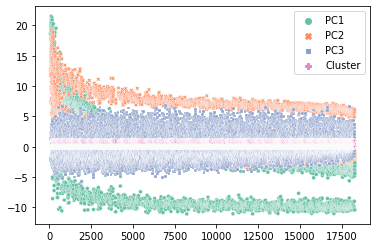

In [107]:
outliers = DBSCAN_dataset[DBSCAN_dataset['Cluster']==-1]
sns.scatterplot(data=DBSCAN_dataset[DBSCAN_dataset['Cluster']!=-1], palette='Set2', legend='full', s=15)
plt.show()

In [109]:
# 3D Plot for visualising Clusters

Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title = 'PC3'))
labels1 = db_default.labels_
trace = go.Scatter3d(x = DBSCAN_dataset.iloc[:,0], y = DBSCAN_dataset.iloc[:,1], z = DBSCAN_dataset.iloc[:,2], 
                     mode='markers', marker=dict(color = labels1, colorscale = 'rainbow', 
                                                size = 3, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height = 750, width = 1000)
dt2 = [trace]
fig = go.Figure(dt2, layout = layout)
fig.update_layout(title='DBSCAN for 3 clusters derived from PCA', font = dict(size = 12,))
fig.show()

In [110]:
# Players in Cluster 0
data_0 = data_db[data_db['Cluster']==0]
data_0.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
69,189513,https://sofifa.com/player/189513/daniel-parejo...,Parejo,Daniel Parejo Muñoz,30,1989-04-16,182,74,Spain,Valencia CF,86,86,41000000,69000,CM,Right,2,4,3,Medium/Medium,Lean,Yes,86100000.0,"#Playmaker , #FK Specialist, #Complete Midfie...",RCM,10.0,NaN,2011-07-01,2022.0,NaN,NaN,41.0,80.0,88.0,79.0,70.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Leadership, Finesse Shot",84,80,61,91,72,79,89,90,88,85,49,35,64,78,72,79,49,76,71,82,58,81,81,86,83,85,69,68,65,5,9,12,14,8,74+2,74+2,74+2,76+2,77+2,77+2,77+2,76+2,80+2,80+2,80+2,77+2,83+2,83+2,83+2,77+2,74+2,78+2,78+2,78+2,74+2,71+2,69+2,69+2,69+2,71+2,0
85,212198,https://sofifa.com/player/212198/bruno-miguel-...,Bruno Fernandes,Bruno Miguel Borges Fernandes,24,1994-09-08,179,69,Portugal,Sporting CP,85,88,49000000,24000,"CAM, CM",Right,2,4,4,High/High,Lean,No,101700000.0,"#Playmaker , #Engine, #Distance Shooter, #Cro...",RCM,8.0,NaN,2017-07-01,2023.0,RCM,16.0,77.0,83.0,87.0,85.0,65.0,74.0,NaN,NaN,NaN,NaN,NaN,NaN,"Avoids Using Weaker Foot, Selfish, Leadership,...",86,77,58,86,86,85,86,87,87,87,79,76,78,84,79,89,72,92,67,88,70,73,81,88,87,86,66,64,57,12,14,15,8,14,79+2,79+2,79+2,83+2,83+2,83+2,83+2,83+2,84+2,84+2,84+2,84+2,84+2,84+2,84+2,84+2,77+2,77+2,77+2,77+2,77+2,74+2,68+2,68+2,68+2,74+2,0
95,208670,https://sofifa.com/player/208670/hakim-ziyech/...,H. Ziyech,Hakim Ziyech,26,1993-03-19,181,65,Morocco,Ajax,85,86,45000000,39000,"CAM, RW",Left,3,2,4,High/Medium,Lean,Yes,66400000.0,"#Playmaker , #Acrobat",RAM,22.0,NaN,2016-08-30,2022.0,NaN,NaN,80.0,75.0,86.0,83.0,50.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Leadership, Argues with Officials, Fi...",84,73,53,86,74,83,90,78,89,83,83,77,86,84,78,80,37,84,58,77,73,52,82,89,67,77,44,56,40,11,7,11,8,14,76+3,76+3,76+3,82+3,81+3,81+3,81+3,82+3,83+3,83+3,83+3,83+3,81+3,81+3,81+3,83+3,69+3,69+3,69+3,69+3,69+3,66+3,57+3,57+3,57+3,66+3,0
96,41236,https://sofifa.com/player/41236/zlatan-ibrahim...,Z. Ibrahimović,Zlatan Ibrahimović,37,1981-10-03,195,95,Sweden,LA Galaxy,85,85,14000000,15000,ST,Right,5,4,5,Medium/Low,Normal,Yes,21000000.0,"#Poacher, #Aerial Threat, #Distance Shooter, #...",ST,9.0,NaN,2018-03-23,2019.0,NaN,NaN,56.0,88.0,77.0,77.0,34.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Argues with Officials, Long Passer (C...",70,86,83,77,88,77,80,78,73,84,57,55,72,82,39,90,68,59,87,88,84,20,91,84,89,90,28,37,24,13,15,10,9,12,82+4,82+4,82+4,77+4,80+4,80+4,80+4,77+4,80+4,80+4,80+4,75+4,74+4,74+4,74+4,75+4,53+4,57+4,57+4,57+4,53+4,50+4,52+4,52+4,52+4,50+4,0
97,143076,https://sofifa.com/player/143076/alejandro-gom...,A. Gómez,Alejandro Darío Gómez,31,1988-02-15,165,68,Argentina,Atalanta,85,85,34000000,92000,"CAM, CF, ST",Right,3,4,4,High/Medium,Normal,No,57800000.0,#Acrobat,CAM,10.0,NaN,2014-09-02,2022.0,NaN,N

In [111]:
# Players in Cluster 1
data_1 = data_db[data_db['Cluster']==1]
data_1.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
125,236583,https://sofifa.com/player/236583/jiri-pavlenka...,J. Pavlenka,Jiří Pavlenka,27,1992-04-14,196,81,Czech Republic,SV Werder Bremen,84,86,26000000,37000,GK,Right,1,3,1,Medium/Medium,Lean,Yes,46200000.0,NaN,GK,1.0,NaN,2017-07-01,2021.0,SUB,23.0,NaN,NaN,NaN,NaN,NaN,NaN,86.0,79.0,70.0,88.0,36.0,80.0,Flair Passes,11,16,14,28,19,12,10,14,17,19,35,37,39,82,27,53,36,20,68,17,22,13,14,25,18,39,12,10,14,86,79,70,80,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
130,167628,https://sofifa.com/player/167628/stephane-ruff...,S. Ruffier,Stéphane Ruffier,32,1986-09-27,188,93,France,AS Saint-Étienne,84,84,19000000,41000,GK,Right,3,3,1,Medium/Medium,Stocky,No,36100000.0,NaN,GK,16.0,NaN,2011-07-11,2021.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.0,84.0,75.0,82.0,48.0,85.0,Flair Passes,11,11,12,33,13,12,17,12,34,15,45,50,51,79,55,56,72,37,76,11,31,25,12,49,25,66,13,12,11,82,84,75,85,82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
131,168435,https://sofifa.com/player/168435/salvatore-sir...,S. Sirigu,Salvatore Sirigu,32,1987-01-12,192,80,Italy,Torino,84,84,19000000,54000,GK,Right,3,2,1,Medium/Medium,Normal,Yes,32300000.0,NaN,GK,39.0,NaN,2017-06-27,2022.0,SUB,1.0,NaN,NaN,NaN,NaN,NaN,NaN,84.0,80.0,76.0,82.0,51.0,84.0,"Diver, Flair",13,10,11,23,12,15,11,11,28,18,50,51,52,79,55,57,68,34,66,14,34,20,10,55,19,62,14,11,13,84,80,76,84,82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
137,177683,https://sofifa.com/player/177683/yann-sommer/2...,Y. Sommer,Yann Sommer,30,1988-12-17,183,79,Switzerland,Borussia Mönchengladbach,84,84,21000000,37000,GK,Right,3,4,1,Medium/Medium,Normal,Yes,35700000.0,NaN,GK,1.0,NaN,2014-07-01,2021.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,79.0,85.0,81.0,87.0,51.0,80.0,"Swerve Pass, Acrobatic Clearance",13,13,10,40,8,15,12,13,31,25,48,54,55,81,58,61,73,45,68,12,38,21,15,58,24,57,9,19,12,79,85,81,80,87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
167,221087,https://sofifa.com/player/221087/pau-lopez-sab...,Pau López,Pau López Sabata,24,1994-12-13,189,77,Spain,Roma,83,88,26000000,38000,GK,Left,1,3,1,Medium/Medium,Lean,Yes,46200000.0,NaN,GK,12.0,NaN,2019-07-10,2024.0,SUB,23.0,NaN,NaN,NaN,NaN,NaN,NaN,82.0,83.0,79.0,84.0,49.0,82.0,NaN,24,19,15,38,17,18,23,21,41,16,45,52,40,74,57,59,71,42,52,18,39,16,20,62,25,62,19,20,11,82,83,79,82,84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [112]:
# Players in Cluster -1. i.e, Outliers(exceptional players)
data_minus_1 = data_db[data_db['Cluster']==-1]
data_minus_1.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Cluster
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,-1
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,-1
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,-1
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW

<Axes: xlabel='Cluster', ylabel='wage_eur'>

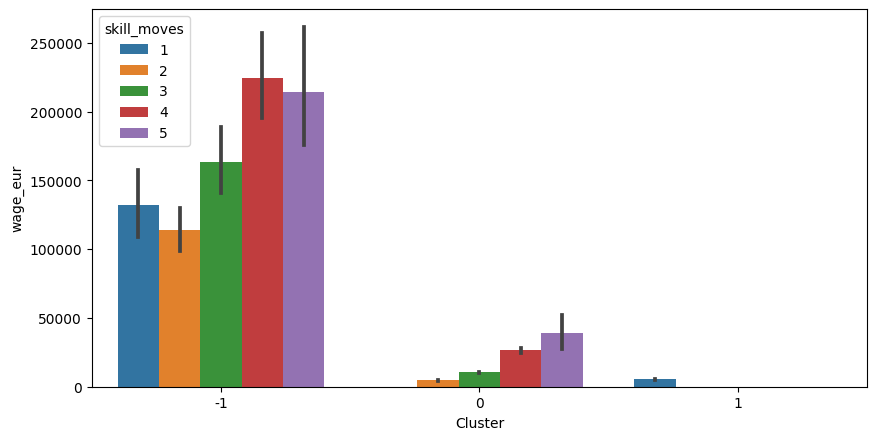

In [113]:
#Distribution wages of players in each cluster based on their skill moves.
plt.figure(figsize=(10,5),facecolor='white',dpi=100)

sns.barplot(data=data_db, y="wage_eur", x="Cluster", hue='skill_moves')

<Axes: xlabel='Cluster', ylabel='potential'>

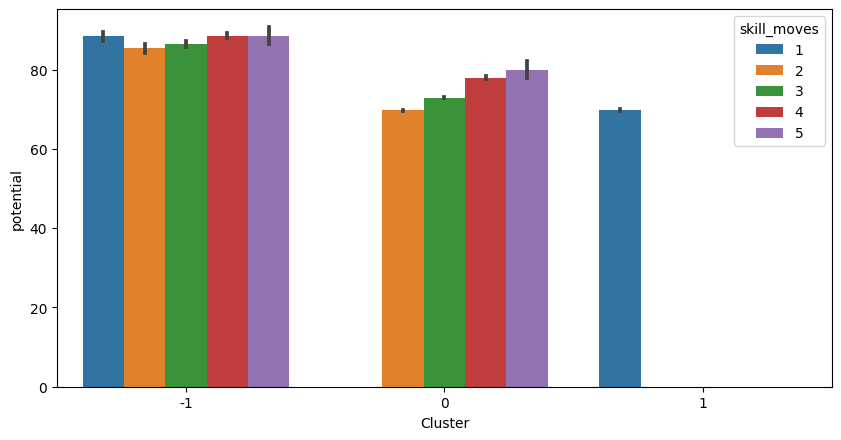

In [115]:
#Distribution of potential of 
#players in each cluster based on their skill moves.
plt.figure(figsize=(10,5),facecolor='white',dpi=100)
sns.barplot(data=data_db, y="potential", x="Cluster", hue='skill_moves')

<Axes: xlabel='potential', ylabel='wage_eur'>

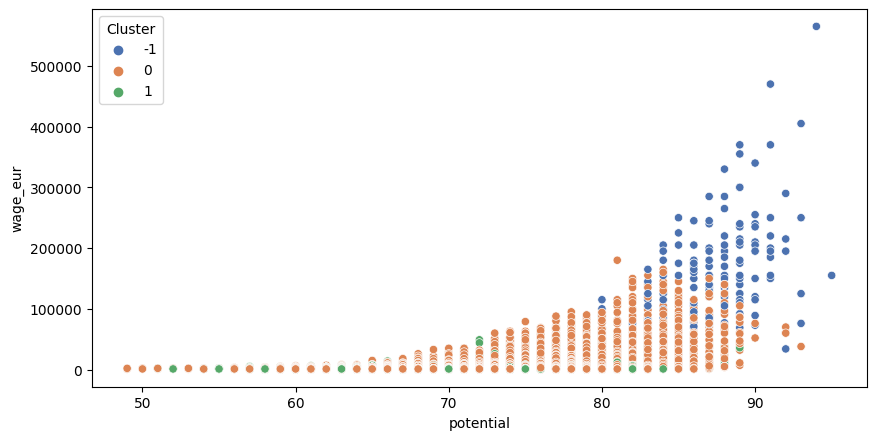

In [116]:
# Scatter plot of Wages and Potenrial of players in each cluster.
plt.figure(figsize=(10,5),facecolor='white',dpi=100)
sns.scatterplot(data=data_db, y="wage_eur", x="potential", hue='Cluster', palette='deep')

## SUMMARY OF THE PROBLEM

By the means of our analysis, we tried to categorized players based on their skillset, strength and physical attributes. We have performed Clustering Analysis which is an unsupervised learning method and built three different models using K-means clustering, Hierarchical clustering and DBSCAN and in the end compared three the models based on their silhouette score. This analysis will be useful for finding suitable replacement of any players.

METHODOLOGY FOLLOWED:

1. A general investigation on the players physical, strengths and skillset attributes has been carroied out using univariate, bivariate and multivariates Exploratory data analysis in order to find the insights from the dataset.

2. The next step of the study was data preprocessing where the data has been cleaned and processed, and the most appropriate part of the data was used while building the models.

3. In the data cleaning step, the redundant data has been removed. The missing value fields has been imputed based on the EDA analysis and finally all the categorical features has been converted into numerical features. 

4. A correlation study has been carried out in order to remove all the highly correlated featues for improving the model accuracy.

5. Robust scaler has been used in order to get the all the features in a single unit.

6. Principal component analysis has been carried to simplfy the complexity in high-dimensional data while retaining trends and patterns.

7. Clustering Analysis using K-means clustering, Hierarchical clustering and DBSCAN has been carried out to obtain clusters of players.

8. To evaluate the performance of the models, silhouette score has been used.

The following question asked along with dataset has been answered:

1. Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that   play at this level?
> The country with more leagues on FIFA 20 is England and has the most number of players in the game

2. Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?
> Most of the players till they reach age of 30 years their overall rating increases steadly and maintains constant overall rating till age of 35 years thereafter there is a decline in the overall rating as seen from the graph with the increases in age. There are a few expectional players who shows an increases in their rating even at the age of 41 years.

3. Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 
> Out of Three types of Offensive Players, Left Wingers players are paid the more compared to Right Wingers and Strikers.

By using the principal component analysis, the number of principal components choosen was 3 by keeping the criteria of variance close to 80%. Hence three principal compenents were choosen for model building. Here the Clustering Analysis were done using K-means clustering, Hierarchical clustering and DBSCAN for categorizing the players based on the skillsets and traits. 

From the KMEANS clustering model, it is seen that, the optimal number of cluster is 2 using the elbow method which has been evaluated using silhouette score of 0.6678.

Using Agglomerative Hierarchical Clustering, the optimal number of cluster 2 using the dendrogram tree by finding the maximum vertical distance that does not cut any horizontal bar containing the samples. The model gave silhouette score of 0.6632.

Using the DBSCAN clustering model, the optimal number of cluster was found by using elbow method and Iterative method. The elbow method gives the appropriate range of epsilon values. Appropriate range of minimum samples were taken for iterative method. Then by applying iterative method, the optimal number of cluster was  2 by visualizing silhouette scores for each iteration. The silhouette score was 0.6790.

All the three clustering models has given approximately the same results and DBSCAN clustering method has given a higher silhouette score of 0.6790. Hence we have choosen DBSCAN clustering method for production.

So based dataset, the number of players in each cluster was found to be
>Clusters --                   No' of Players 

> 1      --                       16105
 
> 2      --                       2015
 
> Exceptional Players --           158

By the means of our analysis, we tried to find suitable replacements players based on their skillset, strength and physical attributes